# Countermeasures model v1

Changes:
* Fixed convolution by creating a tested library version
* Cleared up import code, removed obsolete mask, added text cells
* Improve plotting & writeouts
* Renamed from "basic" to v1 (this is hardly a simple model)
* Move most code to library (WIP)

Model v2:
* Add country unreliability parameter, used as scale multiplier in growth rate and measurement noise.

## Import & initialization

In [24]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [163]:
### Initial imports


import logging
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as T
import matplotlib.pyplot as plt

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from epimodel import RegionDataset, read_csv

from epimodel.pymc3_models.utils import geom_convolution
from epimodel.pymc3_models import cm_effect

## Loading data and parameter settings

In [164]:

Regions = ['AD', 'AT', 'BA', 'BE', 'BG', 'CH', 'CZ', 'DE', 'DK', 
             'EE', 'EG', 'ES', 'FI', 'FR', 'GB', 'GR', 'HR', 'HU', 
             'IE', 'IL', 'IS', 'IT', 'JP', 'KR', 'LT', 'MX', 'NL', 
             'PL', 'RO', 'RS', 'RU', 'SE', 'SG', 'SI', 'SK',
             'ZA', 'MY']
Features = ['Gatherings limited to 10',
              'Gatherings limited to 100',
              'Gatherings limited to 1000',
              'Business suspended - some',
              'Business suspended - many',
              'Schools and universities closed',
              'General curfew',
              'Healthcare specialisation',
              'Mask wearing over 70%',
              'General social distancing',
              'After March 17']



data = cm_effect.loader.Loader('2020-02-15', '2020-04-21', Regions, Features)

# Probability of being in Confirmed cases X days after transmission, from 0
# Generated from Poisson dist., must sum to 1.0
DelayProb = np.array([0.00, 0.01, 0.02, 0.06, 0.10, 0.13, 0.15, 0.15, 0.13, 0.10, 0.07, 0.05, 0.03])
print(f"Delayprob sum={DelayProb.sum()}, E[DP]={np.sum(DelayProb*np.arange(len(DelayProb)))}")


INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']


Delayprob sum=1.0, E[DP]=6.78


## Model definition

In [165]:
with cm_effect.models.CMDeaths(data) as model:
    model.build()

/home/guest/.cache/pypoetry/virtualenvs/epimodel-YNkSmenz-py3.7/lib64/python3.7/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedDeaths contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


## Run MCMC inference

1000 steps is enough for seeing the convergence and rough results, more is better, though.

In [166]:
model.run(1000)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...


HyperGrowthRateMean_log__        -0.77
HyperGrowthRateVar_log__         -0.77
DeathNoise_log__                 -0.77
RegionGrowthRate_log__          -40.87
CM_Alpha_log__                  -22.51
Growth                         3430.06
InitialSize                    -119.20
ObservedDeaths_missing            0.00
ObservedDeaths              -289018.72
Name: Log-probability of test_point, dtype: float64


Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [ObservedDeaths_missing, InitialSize, Growth, CM_Alpha, RegionGrowthRate, DeathNoise, HyperGrowthRateVar, HyperGrowthRateMean]
INFO:pymc3:NUTS: [ObservedDeaths_missing, InitialSize, Growth, CM_Alpha, RegionGrowthRate, DeathNoise, HyperGrowthRateVar, HyperGrowthRateMean]
Sampling 2 chains, 0 divergences: 100%|██████████| 3000/3000 [37:03<00:00,  1.35draws/s] 
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
INFO:pymc3:The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.
ERROR:pymc3:The estimated number of effective samples is smaller than 200 for some parameters.


## Plot chain stability

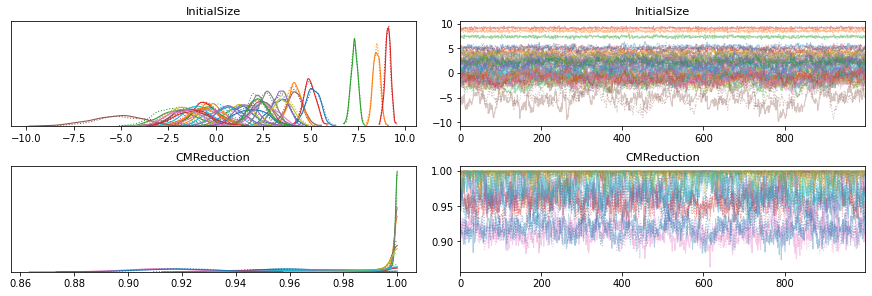

In [167]:
_ = model.plot_traces()

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...


HyperGrowthRateMean_log__        -0.77
HyperGrowthRateVar_log__         -0.77
DeathNoise_log__                 -0.77
RegionGrowthRate_log__          -40.87
CM_Alpha_log__                  -22.51
Growth                         3430.06
InitialSize                    -119.20
ObservedDeaths_missing            0.00
ObservedDeaths              -289018.72
Name: Log-probability of test_point, dtype: float64


Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [ObservedDeaths_missing, InitialSize, Growth, CM_Alpha, RegionGrowthRate, DeathNoise, HyperGrowthRateVar, HyperGrowthRateMean]
INFO:pymc3:NUTS: [ObservedDeaths_missing, InitialSize, Growth, CM_Alpha, RegionGrowthRate, DeathNoise, HyperGrowthRateVar, HyperGrowthRateMean]
Sampling 2 chains, 0 divergences: 100%|██████████| 11000/11000 [2:13:47<00:00,  1.37draws/s] 
The estimated number of effective samples is smaller than 200 for some parameters.
ERROR:pymc3:The estimated number of effective samples is smaller than 200 for some parameters.


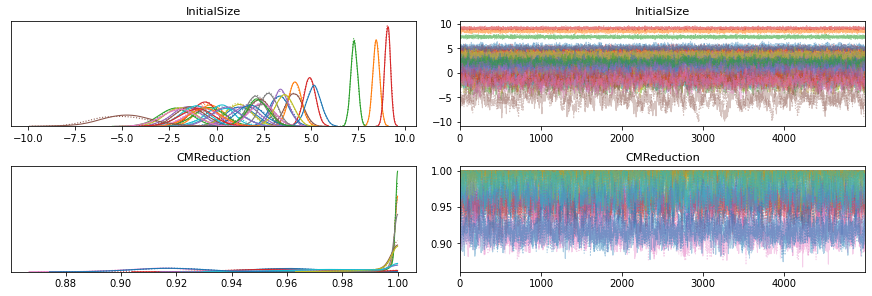

In [168]:
model.run(5000)

_ = model.plot_traces()

## Plot inferred countermeasure effect

Effects are multiplicative (e.g. for a countermeasure that is a strenghtening of another, the inferred strenght is the additional multiplier).

The countermeasure strength is the multiplicative effect at feature=1.0.

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out


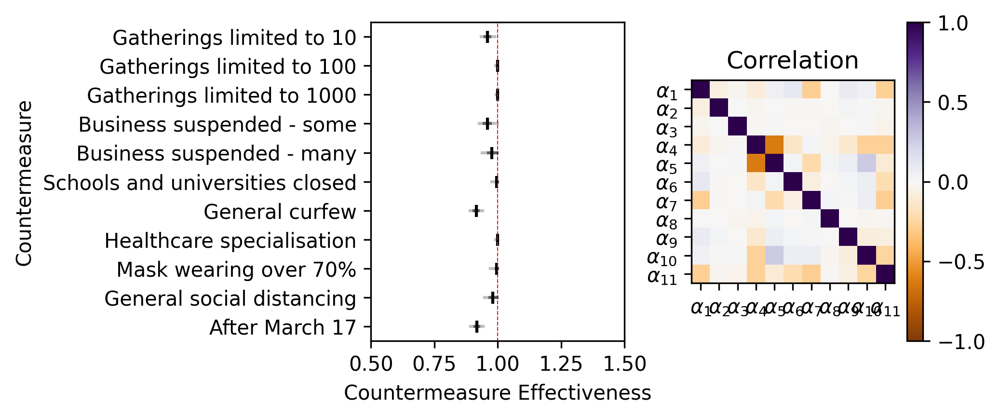

In [169]:
_ = model.plot_effect(labels = Features)

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /home/guest/Dropbox/code/Coronavirus/jsalvatier_epimodel/epimodel/notebooks/out
INFO:epimodel.pymc3_models.

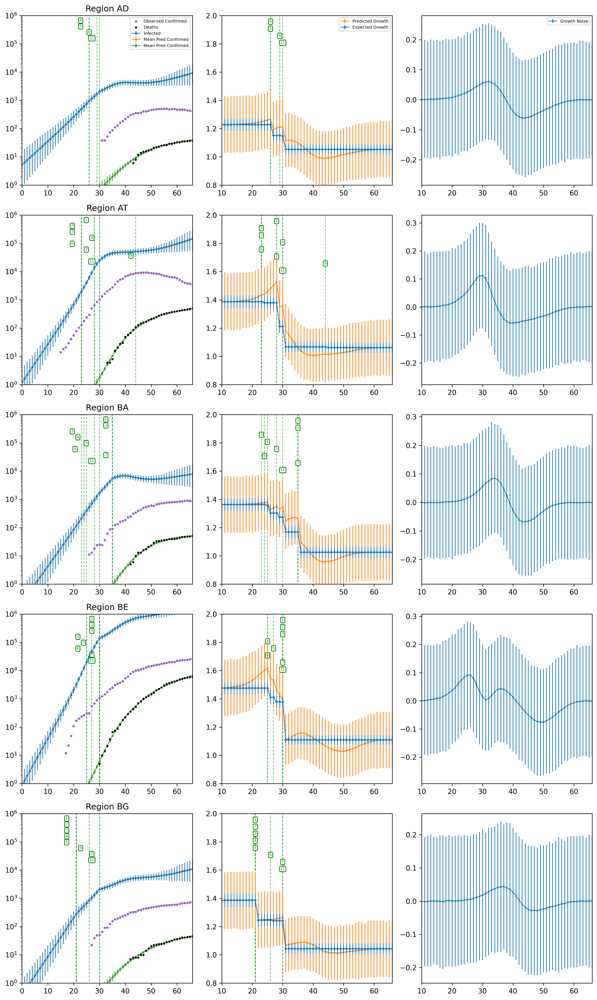

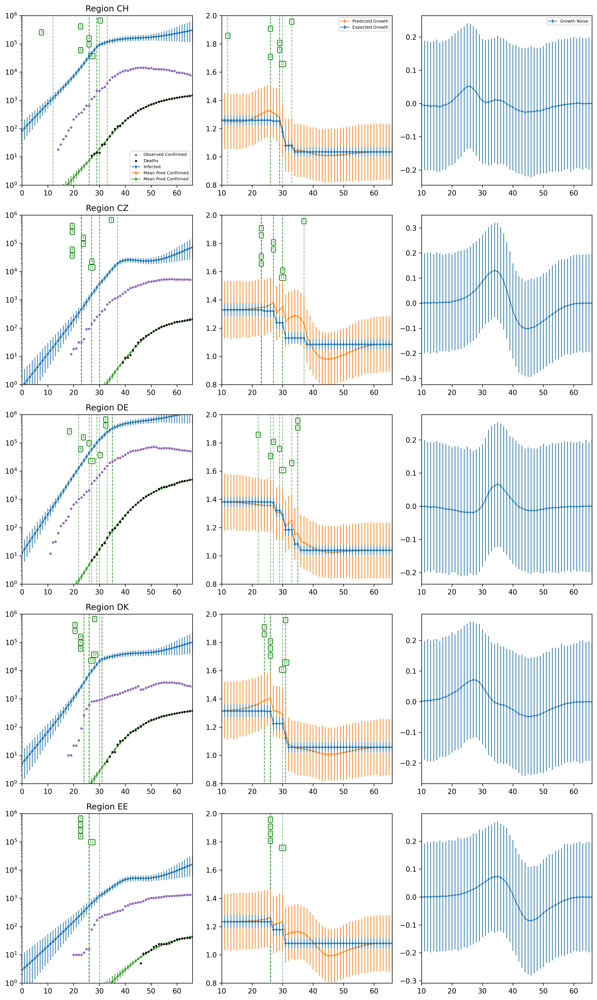

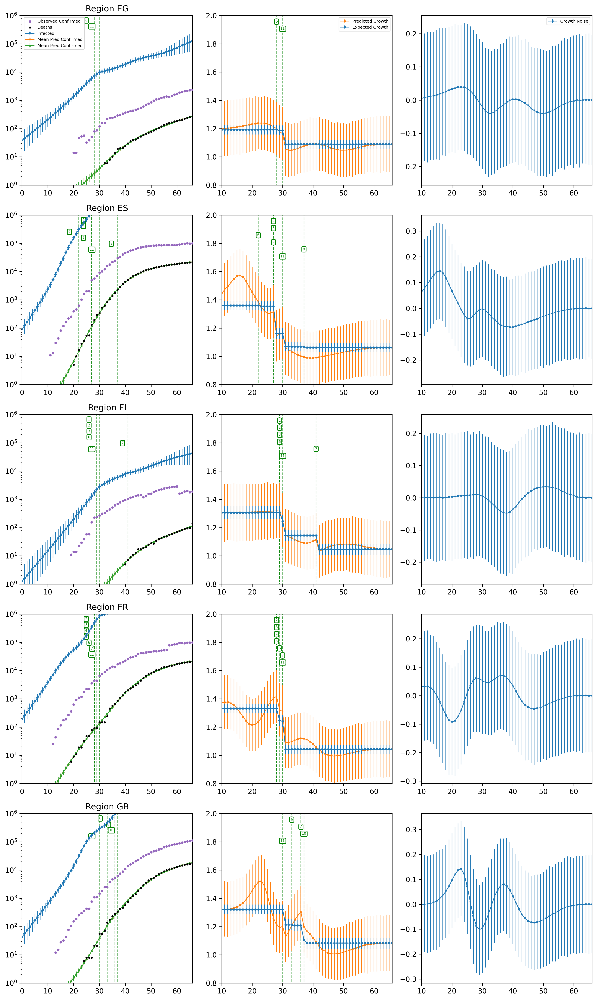

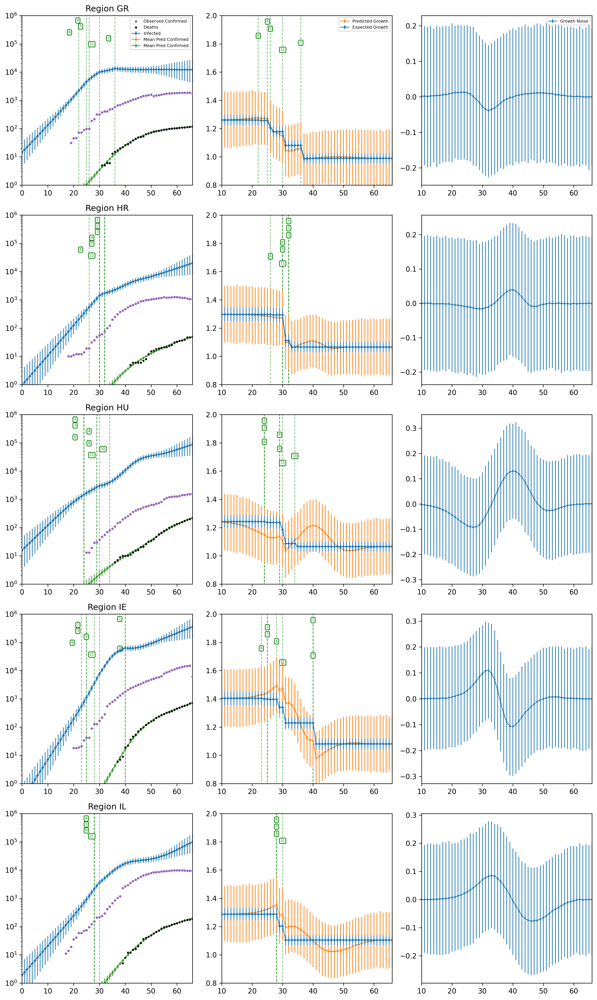

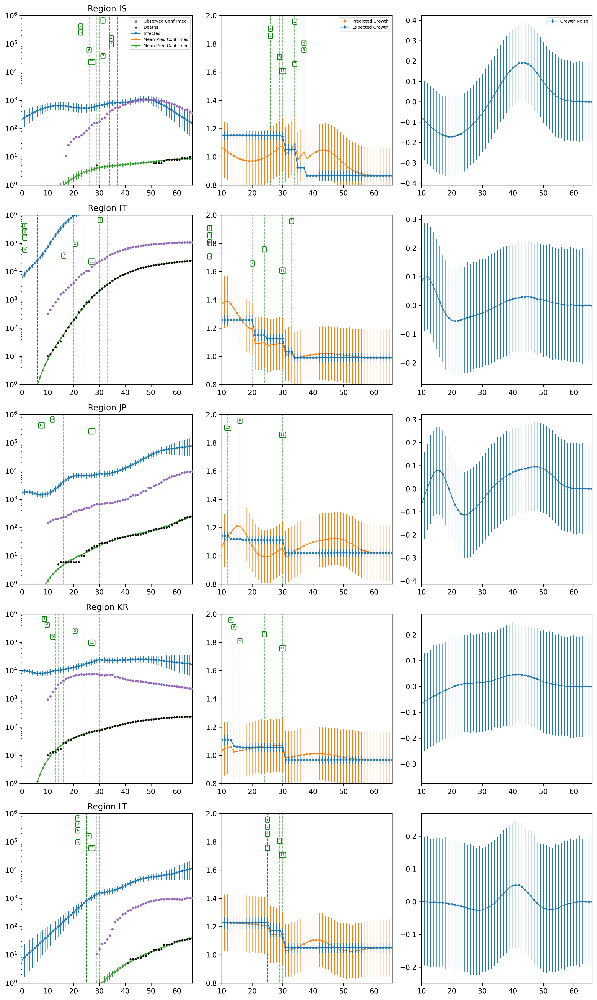

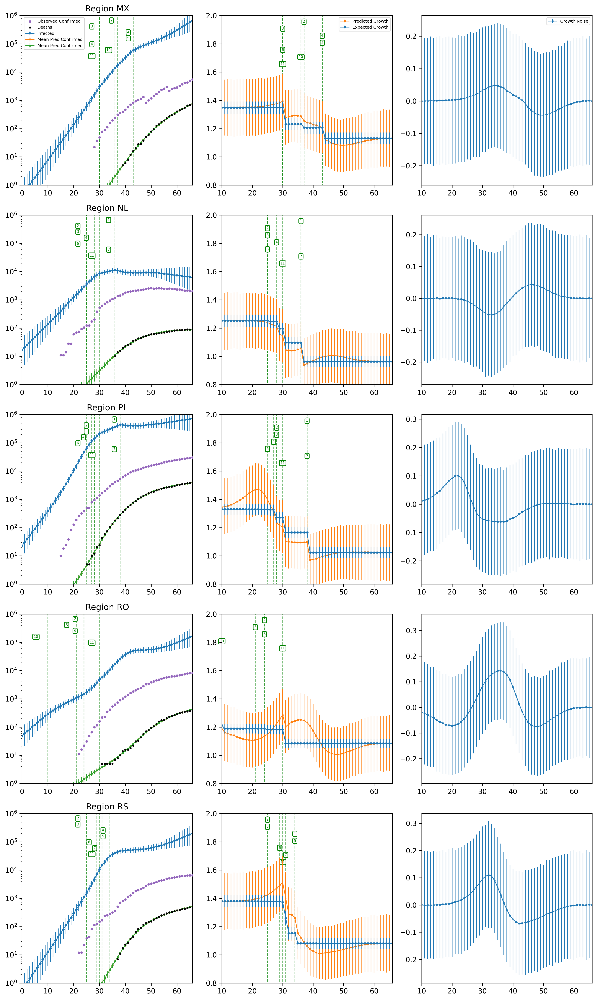

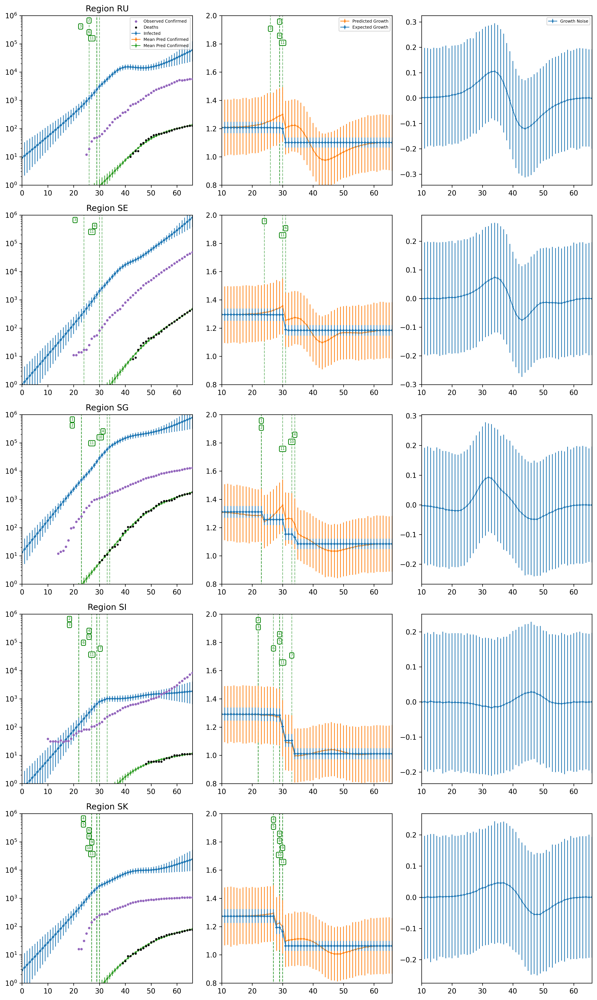

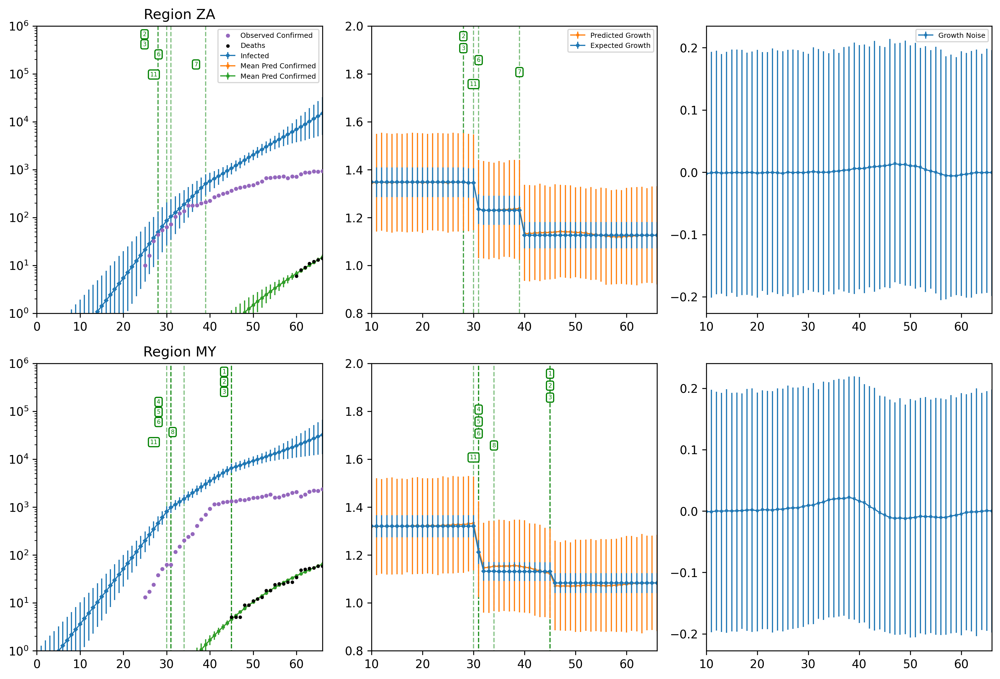

In [170]:
model.ORs = model.d.Rs
model.OR_indxs = list(range(len(model.ORs)))
model.trace.ExpectedConfirmed = model.trace.ExpectedDeaths
model.plot_region_predictions()


In [ ]:
import plotly
from plotly import graph_objects as go
import plotly.express as px
import datetime

def plot_line_CIs(fig, x, ys, name, color, quantiles=(0.05, 0.25), opacities=(0.1, 0.15)):
    x=list(x)
    fig.add_trace(go.Scatter(
        x=x,
        y=list(ys.mean(axis=0)),
        name=name, legendgroup=name, line_color=color
    ))    
    for q, o in zip(quantiles, opacities):
        ylo = list(np.quantile(ys, q, axis=0))
        yhi = list(np.quantile(ys, 1.0-q, axis=0))
        fig.add_trace(go.Scatter(
            x=x + x[::-1],
            y=ylo+yhi[::-1],
            fill='toself',
            fillcolor=color,
            opacity=o,
            line_color='rgba(255,255,255,0)',
            showlegend=False,
            name=name, legendgroup=name,
        ))    
        
fig = go.FigureWidget()
for i, c in enumerate(Cs):
    d = trace['DailyGrowth'][:,i,:]
    color = (px.colors.qualitative.Dark24 * 10)[i]
    plot_line_CIs(fig, Ds[CMDelayCut:], d, c, color)
datestr = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
plotly.io.write_html(fig, f'{datestr}_growth_estimated_v2.html', include_plotlyjs='cdn')
fig

In [19]:
model.d.Confirmed

masked_array(
  data=[[--, --, --, ..., 439.0, 466.0, 501.0],
        [--, --, --, ..., 11524.0, 11781.0, 12051.0],
        [--, --, --, ..., 579.0, 624.0, 654.0],
        ...,
        [--, --, --, ..., 934.0, 977.0, 997.0],
        [--, --, --, ..., 450.0, 471.0, 485.0],
        [--, --, --, ..., 1505.0, 1585.0, 1655.0]],
  mask=[[ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False]],
  fill_value=1e+20)